## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_ve_in_ic.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,TRM,Precio Interno,VIX,EMV-ID,EPU,PI,MHI,FNI,SI
0,2020-01-01,1.289946,3277.14,975000.0,12.548403,1.89,186.06,0.00,0.00,0.00,0.00
1,2020-01-02,0.735046,3277.14,945000.0,12.470000,2.84,139.13,0.00,0.00,0.00,0.00
2,2020-01-03,0.591834,3258.84,940000.0,14.020000,1.33,108.10,0.00,0.00,0.00,0.00
3,2020-01-04,1.367154,3262.05,930000.0,14.646666,0.00,212.82,0.00,0.00,0.00,0.00
4,2020-01-05,1.505321,3262.05,920000.0,14.311970,0.86,173.76,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
913,2022-07-02,0.778572,4198.77,2270000.0,25.922916,11.11,130.95,4.66,25.71,0.19,-3.56
914,2022-07-03,0.819483,4198.77,2270000.0,26.641413,23.06,135.95,0.42,7.76,0.00,-3.67
915,2022-07-04,0.843804,4198.77,2270000.0,27.530000,15.98,309.83,0.54,31.37,0.27,-5.85
916,2022-07-05,0.850985,4198.77,2280000.0,27.540000,18.90,116.59,0.48,38.21,0.12,-4.97


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:0.97638	validation_1-rmse:1.34838
[1]	validation_0-rmse:0.86900	validation_1-rmse:1.68831
[2]	validation_0-rmse:0.79309	validation_1-rmse:1.82466
[3]	validation_0-rmse:0.70513	validation_1-rmse:1.80632
[4]	validation_0-rmse:0.66724	validation_1-rmse:1.89732
[5]	validation_0-rmse:0.59533	validation_1-rmse:1.88727
[6]	validation_0-rmse:0.55251	validation_1-rmse:1.98919
[7]	validation_0-rmse:0.52659	validation_1-rmse:1.99349
[8]	validation_0-rmse:0.50665	validation_1-rmse:1.98641
[9]	validation_0-rmse:0.45931	validation_1-rmse:1.99484
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4885060806860582
MAE is : 0.9955194248512442
RMSE is : 1.2200434749163893
MAPE is : 56.27397090902897
Evaluation metric results:
MSE is : 2.8327974783178944
MAE is : 1.4433357908347924
RMSE is : 1.683091642875662
MAPE is : 84.74215763307143
[0]	validation_0-rmse:0.97638	validation_1-rmse:1.34838
[1]	validation_0-rmse:0.86900	validation_1-rmse:1.68831
[2]	va

[23]	validation_0-rmse:0.18896	validation_1-rmse:2.11264
[24]	validation_0-rmse:0.17866	validation_1-rmse:2.11213
[25]	validation_0-rmse:0.16613	validation_1-rmse:2.11256
[26]	validation_0-rmse:0.16142	validation_1-rmse:2.11385
[27]	validation_0-rmse:0.15130	validation_1-rmse:2.11909
[28]	validation_0-rmse:0.14615	validation_1-rmse:2.10758
[29]	validation_0-rmse:0.14036	validation_1-rmse:2.10761
[30]	validation_0-rmse:0.13300	validation_1-rmse:2.11175
[31]	validation_0-rmse:0.12112	validation_1-rmse:2.11033
[32]	validation_0-rmse:0.11929	validation_1-rmse:2.10976
[33]	validation_0-rmse:0.11578	validation_1-rmse:2.10738
[34]	validation_0-rmse:0.11166	validation_1-rmse:2.10827
[35]	validation_0-rmse:0.10156	validation_1-rmse:2.10540
[36]	validation_0-rmse:0.09797	validation_1-rmse:2.10538
[37]	validation_0-rmse:0.09415	validation_1-rmse:2.10387
[38]	validation_0-rmse:0.08941	validation_1-rmse:2.10385
[39]	validation_0-rmse:0.08707	validation_1-rmse:2.10683
[40]	validation_0-rmse:0.08029	

[46]	validation_0-rmse:0.05423	validation_1-rmse:2.11365
[47]	validation_0-rmse:0.05209	validation_1-rmse:2.11397
[48]	validation_0-rmse:0.04765	validation_1-rmse:2.11652
[49]	validation_0-rmse:0.04409	validation_1-rmse:2.11486
[50]	validation_0-rmse:0.04202	validation_1-rmse:2.11448
[51]	validation_0-rmse:0.03989	validation_1-rmse:2.11433
[52]	validation_0-rmse:0.03847	validation_1-rmse:2.11472
[53]	validation_0-rmse:0.03565	validation_1-rmse:2.11490
[54]	validation_0-rmse:0.03380	validation_1-rmse:2.11529
[55]	validation_0-rmse:0.03350	validation_1-rmse:2.11543
[56]	validation_0-rmse:0.03154	validation_1-rmse:2.11520
[57]	validation_0-rmse:0.03021	validation_1-rmse:2.11423
[58]	validation_0-rmse:0.02966	validation_1-rmse:2.11306
[59]	validation_0-rmse:0.02769	validation_1-rmse:2.11289
[60]	validation_0-rmse:0.02729	validation_1-rmse:2.11291
[61]	validation_0-rmse:0.02568	validation_1-rmse:2.11278
[62]	validation_0-rmse:0.02385	validation_1-rmse:2.11313
[63]	validation_0-rmse:0.02336	

[29]	validation_0-rmse:0.14036	validation_1-rmse:2.10761
[30]	validation_0-rmse:0.13300	validation_1-rmse:2.11175
[31]	validation_0-rmse:0.12112	validation_1-rmse:2.11033
[32]	validation_0-rmse:0.11929	validation_1-rmse:2.10976
[33]	validation_0-rmse:0.11578	validation_1-rmse:2.10738
[34]	validation_0-rmse:0.11166	validation_1-rmse:2.10827
[35]	validation_0-rmse:0.10156	validation_1-rmse:2.10540
[36]	validation_0-rmse:0.09797	validation_1-rmse:2.10538
[37]	validation_0-rmse:0.09415	validation_1-rmse:2.10387
[38]	validation_0-rmse:0.08941	validation_1-rmse:2.10385
[39]	validation_0-rmse:0.08707	validation_1-rmse:2.10683
[40]	validation_0-rmse:0.08029	validation_1-rmse:2.10719
[41]	validation_0-rmse:0.07660	validation_1-rmse:2.10401
[42]	validation_0-rmse:0.07106	validation_1-rmse:2.11055
[43]	validation_0-rmse:0.06917	validation_1-rmse:2.11086
[44]	validation_0-rmse:0.06200	validation_1-rmse:2.11234
[45]	validation_0-rmse:0.05631	validation_1-rmse:2.11352
[46]	validation_0-rmse:0.05423	

[1]	validation_0-rmse:0.86900	validation_1-rmse:1.68831
[2]	validation_0-rmse:0.79309	validation_1-rmse:1.82466
[3]	validation_0-rmse:0.70513	validation_1-rmse:1.80632
[4]	validation_0-rmse:0.66724	validation_1-rmse:1.89732
[5]	validation_0-rmse:0.59533	validation_1-rmse:1.88727
[6]	validation_0-rmse:0.55251	validation_1-rmse:1.98919
[7]	validation_0-rmse:0.52659	validation_1-rmse:1.99349
[8]	validation_0-rmse:0.50665	validation_1-rmse:1.98641
[9]	validation_0-rmse:0.45931	validation_1-rmse:1.99484
[10]	validation_0-rmse:0.43994	validation_1-rmse:2.06314
[11]	validation_0-rmse:0.41479	validation_1-rmse:2.08379
[12]	validation_0-rmse:0.36730	validation_1-rmse:2.06311
[13]	validation_0-rmse:0.34414	validation_1-rmse:2.06058
[14]	validation_0-rmse:0.31682	validation_1-rmse:2.06503
[15]	validation_0-rmse:0.30700	validation_1-rmse:2.11568
[16]	validation_0-rmse:0.29240	validation_1-rmse:2.11140
[17]	validation_0-rmse:0.27064	validation_1-rmse:2.12002
[18]	validation_0-rmse:0.25552	validatio

<ipython-input-3-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[0]	validation_0-rmse:0.97638	validation_1-rmse:1.34838
[1]	validation_0-rmse:0.86900	validation_1-rmse:1.68831
[2]	validation_0-rmse:0.79309	validation_1-rmse:1.82466
[3]	validation_0-rmse:0.70513	validation_1-rmse:1.80632
[4]	validation_0-rmse:0.66724	validation_1-rmse:1.89732
[5]	validation_0-rmse:0.59533	validation_1-rmse:1.88727
[6]	validation_0-rmse:0.55251	validation_1-rmse:1.98919
[7]	validation_0-rmse:0.52659	validation_1-rmse:1.99349
[8]	validation_0-rmse:0.50665	validation_1-rmse:1.98641
[9]	validation_0-rmse:0.45931	validation_1-rmse:1.99484
[10]	validation_0-rmse:0.43994	validation_1-rmse:2.06314
[11]	validation_0-rmse:0.41479	validation_1-rmse:2.08379
[12]	validation_0-rmse:0.36730	validation_1-rmse:2.06311
[13]	validation_0-rmse:0.34414	validation_1-rmse:2.06058
[14]	validation_0-rmse:0.31682	validation_1-rmse:2.06503
[15]	validation_0-rmse:0.30700	validation_1-rmse:2.11568
[16]	validation_0-rmse:0.29240	validation_1-rmse:2.11140
[17]	validation_0-rmse:0.27064	validation

[18]	validation_0-rmse:0.22977	validation_1-rmse:2.79281
[19]	validation_0-rmse:0.21820	validation_1-rmse:2.79790
[20]	validation_0-rmse:0.20575	validation_1-rmse:2.79820
[21]	validation_0-rmse:0.19415	validation_1-rmse:2.79826
[22]	validation_0-rmse:0.18673	validation_1-rmse:2.80126
[23]	validation_0-rmse:0.17341	validation_1-rmse:2.79651
[24]	validation_0-rmse:0.15928	validation_1-rmse:2.79423
[25]	validation_0-rmse:0.14161	validation_1-rmse:2.78777
[26]	validation_0-rmse:0.13017	validation_1-rmse:2.78670
[27]	validation_0-rmse:0.12496	validation_1-rmse:2.78802
[28]	validation_0-rmse:0.12019	validation_1-rmse:2.79167
[29]	validation_0-rmse:0.11323	validation_1-rmse:2.79142
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.494499460766589
MAE is : 0.9942309501348545
RMSE is : 1.2224972232142652
MAPE is : 56.25117274123157
Evaluation metric results:
MSE is : 2.8801641990098186
MAE is : 1.4531690817658203
RMSE is : 1.6971046517554003
MAPE is : 85.722291633

[26]	validation_0-rmse:0.13017	validation_1-rmse:2.78670
[27]	validation_0-rmse:0.12496	validation_1-rmse:2.78802
[28]	validation_0-rmse:0.12019	validation_1-rmse:2.79167
[29]	validation_0-rmse:0.11323	validation_1-rmse:2.79142
[30]	validation_0-rmse:0.10392	validation_1-rmse:2.78893
[31]	validation_0-rmse:0.09799	validation_1-rmse:2.78744
[32]	validation_0-rmse:0.09431	validation_1-rmse:2.78496
[33]	validation_0-rmse:0.08541	validation_1-rmse:2.79491
[34]	validation_0-rmse:0.08009	validation_1-rmse:2.79519
[35]	validation_0-rmse:0.07290	validation_1-rmse:2.79415
[36]	validation_0-rmse:0.06988	validation_1-rmse:2.79696
[37]	validation_0-rmse:0.06671	validation_1-rmse:2.79644
[38]	validation_0-rmse:0.06277	validation_1-rmse:2.79343
[39]	validation_0-rmse:0.06018	validation_1-rmse:2.79299
[40]	validation_0-rmse:0.05800	validation_1-rmse:2.79338
[41]	validation_0-rmse:0.05377	validation_1-rmse:2.79165
[42]	validation_0-rmse:0.05238	validation_1-rmse:2.79095
[43]	validation_0-rmse:0.04823	

[0]	validation_0-rmse:0.97685	validation_1-rmse:1.35960
[1]	validation_0-rmse:0.86080	validation_1-rmse:1.69476
[2]	validation_0-rmse:0.78854	validation_1-rmse:2.11219
[3]	validation_0-rmse:0.73085	validation_1-rmse:2.49274
[4]	validation_0-rmse:0.65101	validation_1-rmse:2.55424
[5]	validation_0-rmse:0.61422	validation_1-rmse:2.75081
[6]	validation_0-rmse:0.53476	validation_1-rmse:2.74505
[7]	validation_0-rmse:0.48272	validation_1-rmse:2.77379
[8]	validation_0-rmse:0.42933	validation_1-rmse:2.76437
[9]	validation_0-rmse:0.40903	validation_1-rmse:2.78726
[10]	validation_0-rmse:0.38150	validation_1-rmse:2.77613
[11]	validation_0-rmse:0.34631	validation_1-rmse:2.78371
[12]	validation_0-rmse:0.31741	validation_1-rmse:2.79408
[13]	validation_0-rmse:0.30121	validation_1-rmse:2.79427
[14]	validation_0-rmse:0.29156	validation_1-rmse:2.79973
[15]	validation_0-rmse:0.28169	validation_1-rmse:2.79113
[16]	validation_0-rmse:0.26474	validation_1-rmse:2.79763
[17]	validation_0-rmse:0.25226	validation

[58]	validation_0-rmse:0.02330	validation_1-rmse:2.78692
[59]	validation_0-rmse:0.02212	validation_1-rmse:2.78655
[60]	validation_0-rmse:0.02066	validation_1-rmse:2.78713
[61]	validation_0-rmse:0.01914	validation_1-rmse:2.78650
[62]	validation_0-rmse:0.01740	validation_1-rmse:2.78644
[63]	validation_0-rmse:0.01657	validation_1-rmse:2.78518
[64]	validation_0-rmse:0.01603	validation_1-rmse:2.78519
[65]	validation_0-rmse:0.01479	validation_1-rmse:2.78437
[66]	validation_0-rmse:0.01380	validation_1-rmse:2.78484
[67]	validation_0-rmse:0.01335	validation_1-rmse:2.78495
[68]	validation_0-rmse:0.01234	validation_1-rmse:2.78551
[69]	validation_0-rmse:0.01141	validation_1-rmse:2.78570
[70]	validation_0-rmse:0.01114	validation_1-rmse:2.78588
[71]	validation_0-rmse:0.01095	validation_1-rmse:2.78600
[72]	validation_0-rmse:0.01064	validation_1-rmse:2.78585
[73]	validation_0-rmse:0.01003	validation_1-rmse:2.78596
[74]	validation_0-rmse:0.00962	validation_1-rmse:2.78589
[75]	validation_0-rmse:0.00898	

[15]	validation_0-rmse:0.26030	validation_1-rmse:2.49138
[16]	validation_0-rmse:0.22998	validation_1-rmse:2.47737
[17]	validation_0-rmse:0.22081	validation_1-rmse:2.48642
[18]	validation_0-rmse:0.20684	validation_1-rmse:2.48611
[19]	validation_0-rmse:0.18933	validation_1-rmse:2.48878
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4834964963615203
MAE is : 0.9932231885498755
RMSE is : 1.217988709455683
MAPE is : 56.15633727534197
Evaluation metric results:
MSE is : 2.849280677598384
MAE is : 1.4442626301035184
RMSE is : 1.6879812432602395
MAPE is : 84.89223199691331
[0]	validation_0-rmse:0.97396	validation_1-rmse:1.35229
[1]	validation_0-rmse:0.86115	validation_1-rmse:1.69717
[2]	validation_0-rmse:0.78229	validation_1-rmse:2.12733
[3]	validation_0-rmse:0.72161	validation_1-rmse:2.52056
[4]	validation_0-rmse:0.63736	validation_1-rmse:2.49205
[5]	validation_0-rmse:0.56460	validation_1-rmse:2.48576
[6]	validation_0-rmse:0.48697	validation_1-rmse:2.44379
[7

[0]	validation_0-rmse:0.97396	validation_1-rmse:1.35229
[1]	validation_0-rmse:0.86115	validation_1-rmse:1.69717
[2]	validation_0-rmse:0.78229	validation_1-rmse:2.12733
[3]	validation_0-rmse:0.72161	validation_1-rmse:2.52056
[4]	validation_0-rmse:0.63736	validation_1-rmse:2.49205
[5]	validation_0-rmse:0.56460	validation_1-rmse:2.48576
[6]	validation_0-rmse:0.48697	validation_1-rmse:2.44379
[7]	validation_0-rmse:0.46009	validation_1-rmse:2.43143
[8]	validation_0-rmse:0.43646	validation_1-rmse:2.52955
[9]	validation_0-rmse:0.40526	validation_1-rmse:2.51670
[10]	validation_0-rmse:0.37432	validation_1-rmse:2.50839
[11]	validation_0-rmse:0.33533	validation_1-rmse:2.50804
[12]	validation_0-rmse:0.32044	validation_1-rmse:2.50494
[13]	validation_0-rmse:0.28581	validation_1-rmse:2.48042
[14]	validation_0-rmse:0.26878	validation_1-rmse:2.48270
[15]	validation_0-rmse:0.26030	validation_1-rmse:2.49138
[16]	validation_0-rmse:0.22998	validation_1-rmse:2.47737
[17]	validation_0-rmse:0.22081	validation

[3]	validation_0-rmse:0.72161	validation_1-rmse:2.52056
[4]	validation_0-rmse:0.63736	validation_1-rmse:2.49205
[5]	validation_0-rmse:0.56460	validation_1-rmse:2.48576
[6]	validation_0-rmse:0.48697	validation_1-rmse:2.44379
[7]	validation_0-rmse:0.46009	validation_1-rmse:2.43143
[8]	validation_0-rmse:0.43646	validation_1-rmse:2.52955
[9]	validation_0-rmse:0.40526	validation_1-rmse:2.51670
[10]	validation_0-rmse:0.37432	validation_1-rmse:2.50839
[11]	validation_0-rmse:0.33533	validation_1-rmse:2.50804
[12]	validation_0-rmse:0.32044	validation_1-rmse:2.50494
[13]	validation_0-rmse:0.28581	validation_1-rmse:2.48042
[14]	validation_0-rmse:0.26878	validation_1-rmse:2.48270
[15]	validation_0-rmse:0.26030	validation_1-rmse:2.49138
[16]	validation_0-rmse:0.22998	validation_1-rmse:2.47737
[17]	validation_0-rmse:0.22081	validation_1-rmse:2.48642
[18]	validation_0-rmse:0.20684	validation_1-rmse:2.48611
[19]	validation_0-rmse:0.18933	validation_1-rmse:2.48878
[20]	validation_0-rmse:0.17401	validat

[62]	validation_0-rmse:0.01280	validation_1-rmse:2.47365
[63]	validation_0-rmse:0.01220	validation_1-rmse:2.47362
[64]	validation_0-rmse:0.01178	validation_1-rmse:2.47368
[65]	validation_0-rmse:0.01139	validation_1-rmse:2.47351
[66]	validation_0-rmse:0.01081	validation_1-rmse:2.47361
[67]	validation_0-rmse:0.00982	validation_1-rmse:2.47381
[68]	validation_0-rmse:0.00916	validation_1-rmse:2.47364
[69]	validation_0-rmse:0.00849	validation_1-rmse:2.47360
[70]	validation_0-rmse:0.00793	validation_1-rmse:2.47404
[71]	validation_0-rmse:0.00751	validation_1-rmse:2.47416
[72]	validation_0-rmse:0.00713	validation_1-rmse:2.47435
[73]	validation_0-rmse:0.00690	validation_1-rmse:2.47510
[74]	validation_0-rmse:0.00644	validation_1-rmse:2.47507
[75]	validation_0-rmse:0.00600	validation_1-rmse:2.47523
[76]	validation_0-rmse:0.00580	validation_1-rmse:2.47515
[77]	validation_0-rmse:0.00554	validation_1-rmse:2.47529
[78]	validation_0-rmse:0.00528	validation_1-rmse:2.47519
[79]	validation_0-rmse:0.00520	

[34]	validation_0-rmse:0.05902	validation_1-rmse:2.48041
[35]	validation_0-rmse:0.05621	validation_1-rmse:2.48152
[36]	validation_0-rmse:0.05336	validation_1-rmse:2.48155
[37]	validation_0-rmse:0.05079	validation_1-rmse:2.48062
[38]	validation_0-rmse:0.04703	validation_1-rmse:2.48075
[39]	validation_0-rmse:0.04605	validation_1-rmse:2.48065
[40]	validation_0-rmse:0.04375	validation_1-rmse:2.47977
[41]	validation_0-rmse:0.04222	validation_1-rmse:2.47994
[42]	validation_0-rmse:0.04027	validation_1-rmse:2.47907
[43]	validation_0-rmse:0.03815	validation_1-rmse:2.47857
[44]	validation_0-rmse:0.03611	validation_1-rmse:2.47783
[45]	validation_0-rmse:0.03268	validation_1-rmse:2.47797
[46]	validation_0-rmse:0.03180	validation_1-rmse:2.47833
[47]	validation_0-rmse:0.03077	validation_1-rmse:2.47828
[48]	validation_0-rmse:0.02890	validation_1-rmse:2.47710
[49]	validation_0-rmse:0.02738	validation_1-rmse:2.47752
[50]	validation_0-rmse:0.02611	validation_1-rmse:2.47690
[51]	validation_0-rmse:0.02513	

[6]	validation_0-rmse:0.53102	validation_1-rmse:1.56641
[7]	validation_0-rmse:0.46880	validation_1-rmse:1.57978
[8]	validation_0-rmse:0.43031	validation_1-rmse:1.57009
[9]	validation_0-rmse:0.40475	validation_1-rmse:1.56145
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4846140916126436
MAE is : 0.9934871510656706
RMSE is : 1.218447410277786
MAPE is : 56.19415586484842
Evaluation metric results:
MSE is : 2.8474637442183135
MAE is : 1.4442626301035184
RMSE is : 1.687442960285862
MAPE is : 84.90128115485751
[0]	validation_0-rmse:0.97400	validation_1-rmse:1.35186
[1]	validation_0-rmse:0.86033	validation_1-rmse:1.69739
[2]	validation_0-rmse:0.77553	validation_1-rmse:1.63480
[3]	validation_0-rmse:0.71016	validation_1-rmse:1.61287
[4]	validation_0-rmse:0.66378	validation_1-rmse:1.58953
[5]	validation_0-rmse:0.59371	validation_1-rmse:1.56686
[6]	validation_0-rmse:0.53102	validation_1-rmse:1.56641
[7]	validation_0-rmse:0.46880	validation_1-rmse:1.57978
[8]	val

[28]	validation_0-rmse:0.11227	validation_1-rmse:1.55563
[29]	validation_0-rmse:0.10683	validation_1-rmse:1.55471
[30]	validation_0-rmse:0.10077	validation_1-rmse:1.55202
[31]	validation_0-rmse:0.09483	validation_1-rmse:1.55320
[32]	validation_0-rmse:0.08763	validation_1-rmse:1.55433
[33]	validation_0-rmse:0.08381	validation_1-rmse:1.55373
[34]	validation_0-rmse:0.08168	validation_1-rmse:1.55295
[35]	validation_0-rmse:0.07944	validation_1-rmse:1.55309
[36]	validation_0-rmse:0.07433	validation_1-rmse:1.55297
[37]	validation_0-rmse:0.07121	validation_1-rmse:1.55480
[38]	validation_0-rmse:0.06766	validation_1-rmse:1.55382
[39]	validation_0-rmse:0.06553	validation_1-rmse:1.55364
[40]	validation_0-rmse:0.06199	validation_1-rmse:1.55349
[41]	validation_0-rmse:0.05560	validation_1-rmse:1.55476
[42]	validation_0-rmse:0.05303	validation_1-rmse:1.55380
[43]	validation_0-rmse:0.05157	validation_1-rmse:1.55382
[44]	validation_0-rmse:0.04573	validation_1-rmse:1.55400
[45]	validation_0-rmse:0.04394	

[51]	validation_0-rmse:0.03292	validation_1-rmse:1.55433
[52]	validation_0-rmse:0.03173	validation_1-rmse:1.55448
[53]	validation_0-rmse:0.02875	validation_1-rmse:1.55381
[54]	validation_0-rmse:0.02742	validation_1-rmse:1.55348
[55]	validation_0-rmse:0.02588	validation_1-rmse:1.55358
[56]	validation_0-rmse:0.02496	validation_1-rmse:1.55446
[57]	validation_0-rmse:0.02341	validation_1-rmse:1.55414
[58]	validation_0-rmse:0.02302	validation_1-rmse:1.55373
[59]	validation_0-rmse:0.02222	validation_1-rmse:1.55264
[60]	validation_0-rmse:0.02167	validation_1-rmse:1.55280
[61]	validation_0-rmse:0.01994	validation_1-rmse:1.55278
[62]	validation_0-rmse:0.01902	validation_1-rmse:1.55317
[63]	validation_0-rmse:0.01798	validation_1-rmse:1.55323
[64]	validation_0-rmse:0.01667	validation_1-rmse:1.55332
[65]	validation_0-rmse:0.01578	validation_1-rmse:1.55332
[66]	validation_0-rmse:0.01532	validation_1-rmse:1.55329
[67]	validation_0-rmse:0.01481	validation_1-rmse:1.55315
[68]	validation_0-rmse:0.01342	

[34]	validation_0-rmse:0.08168	validation_1-rmse:1.55295
[35]	validation_0-rmse:0.07944	validation_1-rmse:1.55309
[36]	validation_0-rmse:0.07433	validation_1-rmse:1.55297
[37]	validation_0-rmse:0.07121	validation_1-rmse:1.55480
[38]	validation_0-rmse:0.06766	validation_1-rmse:1.55382
[39]	validation_0-rmse:0.06553	validation_1-rmse:1.55364
[40]	validation_0-rmse:0.06199	validation_1-rmse:1.55349
[41]	validation_0-rmse:0.05560	validation_1-rmse:1.55476
[42]	validation_0-rmse:0.05303	validation_1-rmse:1.55380
[43]	validation_0-rmse:0.05157	validation_1-rmse:1.55382
[44]	validation_0-rmse:0.04573	validation_1-rmse:1.55400
[45]	validation_0-rmse:0.04394	validation_1-rmse:1.55457
[46]	validation_0-rmse:0.04179	validation_1-rmse:1.55490
[47]	validation_0-rmse:0.03877	validation_1-rmse:1.55459
[48]	validation_0-rmse:0.03713	validation_1-rmse:1.55431
[49]	validation_0-rmse:0.03526	validation_1-rmse:1.55448
[50]	validation_0-rmse:0.03397	validation_1-rmse:1.55460
[51]	validation_0-rmse:0.03292	

[7]	validation_0-rmse:0.46880	validation_1-rmse:1.57978
[8]	validation_0-rmse:0.43031	validation_1-rmse:1.57009
[9]	validation_0-rmse:0.40475	validation_1-rmse:1.56145
[10]	validation_0-rmse:0.35648	validation_1-rmse:1.56494
[11]	validation_0-rmse:0.32309	validation_1-rmse:1.55852
[12]	validation_0-rmse:0.29618	validation_1-rmse:1.56140
[13]	validation_0-rmse:0.28046	validation_1-rmse:1.57187
[14]	validation_0-rmse:0.26091	validation_1-rmse:1.56679
[15]	validation_0-rmse:0.24278	validation_1-rmse:1.56298
[16]	validation_0-rmse:0.22864	validation_1-rmse:1.56191
[17]	validation_0-rmse:0.20319	validation_1-rmse:1.55256
[18]	validation_0-rmse:0.19574	validation_1-rmse:1.55326
[19]	validation_0-rmse:0.18649	validation_1-rmse:1.55424
[20]	validation_0-rmse:0.17200	validation_1-rmse:1.55251
[21]	validation_0-rmse:0.16477	validation_1-rmse:1.55348
[22]	validation_0-rmse:0.14980	validation_1-rmse:1.55259
[23]	validation_0-rmse:0.14580	validation_1-rmse:1.55545
[24]	validation_0-rmse:0.14126	val

[66]	validation_0-rmse:0.01532	validation_1-rmse:1.55329
[67]	validation_0-rmse:0.01481	validation_1-rmse:1.55315
[68]	validation_0-rmse:0.01342	validation_1-rmse:1.55261
[69]	validation_0-rmse:0.01298	validation_1-rmse:1.55284
[70]	validation_0-rmse:0.01253	validation_1-rmse:1.55298
[71]	validation_0-rmse:0.01142	validation_1-rmse:1.55288
[72]	validation_0-rmse:0.01083	validation_1-rmse:1.55299
[73]	validation_0-rmse:0.01026	validation_1-rmse:1.55289
[74]	validation_0-rmse:0.00954	validation_1-rmse:1.55314
[75]	validation_0-rmse:0.00907	validation_1-rmse:1.55320
[76]	validation_0-rmse:0.00864	validation_1-rmse:1.55324
[77]	validation_0-rmse:0.00813	validation_1-rmse:1.55342
[78]	validation_0-rmse:0.00784	validation_1-rmse:1.55331
[79]	validation_0-rmse:0.00751	validation_1-rmse:1.55355
[80]	validation_0-rmse:0.00717	validation_1-rmse:1.55353
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4846140916126436
MAE is : 0.9934871510656706
RMSE is : 1.2184474

[2]	validation_0-rmse:0.76918	validation_1-rmse:1.66164
[3]	validation_0-rmse:0.68856	validation_1-rmse:1.69186
[4]	validation_0-rmse:0.64411	validation_1-rmse:1.64808
[5]	validation_0-rmse:0.61802	validation_1-rmse:1.84956
[6]	validation_0-rmse:0.56708	validation_1-rmse:1.88688
[7]	validation_0-rmse:0.51844	validation_1-rmse:1.92030
[8]	validation_0-rmse:0.48463	validation_1-rmse:1.91476
[9]	validation_0-rmse:0.43076	validation_1-rmse:1.89753
[10]	validation_0-rmse:0.39403	validation_1-rmse:1.84232
[11]	validation_0-rmse:0.35210	validation_1-rmse:1.85481
[12]	validation_0-rmse:0.32926	validation_1-rmse:1.86318
[13]	validation_0-rmse:0.29874	validation_1-rmse:1.86288
[14]	validation_0-rmse:0.28313	validation_1-rmse:1.86743
[15]	validation_0-rmse:0.26512	validation_1-rmse:1.88295
[16]	validation_0-rmse:0.24691	validation_1-rmse:1.88473
[17]	validation_0-rmse:0.23063	validation_1-rmse:1.88323
[18]	validation_0-rmse:0.21866	validation_1-rmse:1.87000
[19]	validation_0-rmse:0.20574	validati

[25]	validation_0-rmse:0.12664	validation_1-rmse:1.88241
[26]	validation_0-rmse:0.11745	validation_1-rmse:1.88593
[27]	validation_0-rmse:0.11177	validation_1-rmse:1.88537
[28]	validation_0-rmse:0.10348	validation_1-rmse:1.88638
[29]	validation_0-rmse:0.09823	validation_1-rmse:1.88572
[30]	validation_0-rmse:0.09267	validation_1-rmse:1.88083
[31]	validation_0-rmse:0.08775	validation_1-rmse:1.88182
[32]	validation_0-rmse:0.08254	validation_1-rmse:1.87994
[33]	validation_0-rmse:0.07799	validation_1-rmse:1.87833
[34]	validation_0-rmse:0.07343	validation_1-rmse:1.87937
[35]	validation_0-rmse:0.06520	validation_1-rmse:1.87920
[36]	validation_0-rmse:0.06252	validation_1-rmse:1.87942
[37]	validation_0-rmse:0.06077	validation_1-rmse:1.87649
[38]	validation_0-rmse:0.05573	validation_1-rmse:1.87796
[39]	validation_0-rmse:0.05236	validation_1-rmse:1.87831
[40]	validation_0-rmse:0.05039	validation_1-rmse:1.87807
[41]	validation_0-rmse:0.04880	validation_1-rmse:1.87884
[42]	validation_0-rmse:0.04603	

[8]	validation_0-rmse:0.48463	validation_1-rmse:1.91476
[9]	validation_0-rmse:0.43076	validation_1-rmse:1.89753
[10]	validation_0-rmse:0.39403	validation_1-rmse:1.84232
[11]	validation_0-rmse:0.35210	validation_1-rmse:1.85481
[12]	validation_0-rmse:0.32926	validation_1-rmse:1.86318
[13]	validation_0-rmse:0.29874	validation_1-rmse:1.86288
[14]	validation_0-rmse:0.28313	validation_1-rmse:1.86743
[15]	validation_0-rmse:0.26512	validation_1-rmse:1.88295
[16]	validation_0-rmse:0.24691	validation_1-rmse:1.88473
[17]	validation_0-rmse:0.23063	validation_1-rmse:1.88323
[18]	validation_0-rmse:0.21866	validation_1-rmse:1.87000
[19]	validation_0-rmse:0.20574	validation_1-rmse:1.87235
[20]	validation_0-rmse:0.17685	validation_1-rmse:1.88381
[21]	validation_0-rmse:0.16966	validation_1-rmse:1.89080
[22]	validation_0-rmse:0.16337	validation_1-rmse:1.89405
[23]	validation_0-rmse:0.15085	validation_1-rmse:1.89123
[24]	validation_0-rmse:0.13745	validation_1-rmse:1.88511
[25]	validation_0-rmse:0.12664	va

[67]	validation_0-rmse:0.01066	validation_1-rmse:1.88108
[68]	validation_0-rmse:0.01018	validation_1-rmse:1.88123
[69]	validation_0-rmse:0.00968	validation_1-rmse:1.88118
[70]	validation_0-rmse:0.00862	validation_1-rmse:1.88133
[71]	validation_0-rmse:0.00833	validation_1-rmse:1.88159
[72]	validation_0-rmse:0.00791	validation_1-rmse:1.88178
[73]	validation_0-rmse:0.00766	validation_1-rmse:1.88230
[74]	validation_0-rmse:0.00716	validation_1-rmse:1.88230
[75]	validation_0-rmse:0.00696	validation_1-rmse:1.88220
[76]	validation_0-rmse:0.00657	validation_1-rmse:1.88220
[77]	validation_0-rmse:0.00613	validation_1-rmse:1.88222
[78]	validation_0-rmse:0.00565	validation_1-rmse:1.88240
[79]	validation_0-rmse:0.00547	validation_1-rmse:1.88243
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4872838700763487
MAE is : 0.9951500512960235
RMSE is : 1.21954248391614
MAPE is : 56.29958656881582
Evaluation metric results:
MSE is : 2.847427409413138
MAE is : 1.4442467502167

[40]	validation_0-rmse:0.05039	validation_1-rmse:1.87807
[41]	validation_0-rmse:0.04880	validation_1-rmse:1.87884
[42]	validation_0-rmse:0.04603	validation_1-rmse:1.87933
[43]	validation_0-rmse:0.04355	validation_1-rmse:1.87997
[44]	validation_0-rmse:0.04064	validation_1-rmse:1.88072
[45]	validation_0-rmse:0.03770	validation_1-rmse:1.88117
[46]	validation_0-rmse:0.03508	validation_1-rmse:1.88335
[47]	validation_0-rmse:0.03297	validation_1-rmse:1.88213
[48]	validation_0-rmse:0.03032	validation_1-rmse:1.88203
[49]	validation_0-rmse:0.02926	validation_1-rmse:1.88185
[50]	validation_0-rmse:0.02848	validation_1-rmse:1.88189
[51]	validation_0-rmse:0.02740	validation_1-rmse:1.88224
[52]	validation_0-rmse:0.02441	validation_1-rmse:1.88085
[53]	validation_0-rmse:0.02366	validation_1-rmse:1.88176
[54]	validation_0-rmse:0.02330	validation_1-rmse:1.88162
[55]	validation_0-rmse:0.02098	validation_1-rmse:1.88150
[56]	validation_0-rmse:0.01887	validation_1-rmse:1.88117
[57]	validation_0-rmse:0.01806	

[22]	validation_0-rmse:0.12974	validation_1-rmse:1.60400
[23]	validation_0-rmse:0.11384	validation_1-rmse:1.60447
[24]	validation_0-rmse:0.10631	validation_1-rmse:1.60280
[25]	validation_0-rmse:0.09618	validation_1-rmse:1.60238
[26]	validation_0-rmse:0.09136	validation_1-rmse:1.60398
[27]	validation_0-rmse:0.08723	validation_1-rmse:1.60384
[28]	validation_0-rmse:0.08321	validation_1-rmse:1.60506
[29]	validation_0-rmse:0.07659	validation_1-rmse:1.60358
[30]	validation_0-rmse:0.07225	validation_1-rmse:1.60692
[31]	validation_0-rmse:0.06535	validation_1-rmse:1.60292
[32]	validation_0-rmse:0.06148	validation_1-rmse:1.60277
[33]	validation_0-rmse:0.05861	validation_1-rmse:1.60193
[34]	validation_0-rmse:0.05508	validation_1-rmse:1.60267
[35]	validation_0-rmse:0.05050	validation_1-rmse:1.60325
[36]	validation_0-rmse:0.04672	validation_1-rmse:1.60278
[37]	validation_0-rmse:0.04438	validation_1-rmse:1.60281
[38]	validation_0-rmse:0.03979	validation_1-rmse:1.60208
[39]	validation_0-rmse:0.03721	

[0]	validation_0-rmse:0.96907	validation_1-rmse:1.35963
[1]	validation_0-rmse:0.85809	validation_1-rmse:1.71089
[2]	validation_0-rmse:0.73856	validation_1-rmse:1.66665
[3]	validation_0-rmse:0.63277	validation_1-rmse:1.64936
[4]	validation_0-rmse:0.58403	validation_1-rmse:1.63745
[5]	validation_0-rmse:0.54610	validation_1-rmse:1.60240
[6]	validation_0-rmse:0.49371	validation_1-rmse:1.58504
[7]	validation_0-rmse:0.43565	validation_1-rmse:1.61423
[8]	validation_0-rmse:0.41045	validation_1-rmse:1.59406
[9]	validation_0-rmse:0.36650	validation_1-rmse:1.59143
[10]	validation_0-rmse:0.31682	validation_1-rmse:1.58899
[11]	validation_0-rmse:0.29680	validation_1-rmse:1.60848
[12]	validation_0-rmse:0.27832	validation_1-rmse:1.60792
[13]	validation_0-rmse:0.25910	validation_1-rmse:1.61037
[14]	validation_0-rmse:0.23979	validation_1-rmse:1.60948
[15]	validation_0-rmse:0.22104	validation_1-rmse:1.61018
[16]	validation_0-rmse:0.21197	validation_1-rmse:1.61193
[17]	validation_0-rmse:0.19443	validation

[69]	validation_0-rmse:0.00547	validation_1-rmse:1.59694
[70]	validation_0-rmse:0.00467	validation_1-rmse:1.59711
[71]	validation_0-rmse:0.00433	validation_1-rmse:1.59713
[72]	validation_0-rmse:0.00417	validation_1-rmse:1.59716
[73]	validation_0-rmse:0.00401	validation_1-rmse:1.59716
[74]	validation_0-rmse:0.00383	validation_1-rmse:1.59702
[75]	validation_0-rmse:0.00359	validation_1-rmse:1.59700
[76]	validation_0-rmse:0.00344	validation_1-rmse:1.59694
[77]	validation_0-rmse:0.00327	validation_1-rmse:1.59698
[78]	validation_0-rmse:0.00304	validation_1-rmse:1.59699
[79]	validation_0-rmse:0.00277	validation_1-rmse:1.59698
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4782795778701876
MAE is : 0.9934747445042679
RMSE is : 1.2158452113119447
MAPE is : 56.130260988893966
Evaluation metric results:
MSE is : 2.88026352667542
MAE is : 1.4546016923865226
RMSE is : 1.6971339153630216
MAPE is : 85.8471016238374
[0]	validation_0-rmse:0.96907	validation_1-rmse:1.35

[42]	validation_0-rmse:0.03035	validation_1-rmse:1.59978
[43]	validation_0-rmse:0.02807	validation_1-rmse:1.59890
[44]	validation_0-rmse:0.02636	validation_1-rmse:1.59739
[45]	validation_0-rmse:0.02418	validation_1-rmse:1.59712
[46]	validation_0-rmse:0.02316	validation_1-rmse:1.59781
[47]	validation_0-rmse:0.02232	validation_1-rmse:1.59787
[48]	validation_0-rmse:0.02098	validation_1-rmse:1.59769
[49]	validation_0-rmse:0.01980	validation_1-rmse:1.59805
[50]	validation_0-rmse:0.01925	validation_1-rmse:1.59799
[51]	validation_0-rmse:0.01809	validation_1-rmse:1.59815
[52]	validation_0-rmse:0.01667	validation_1-rmse:1.59861
[53]	validation_0-rmse:0.01516	validation_1-rmse:1.59869
[54]	validation_0-rmse:0.01465	validation_1-rmse:1.59852
[55]	validation_0-rmse:0.01343	validation_1-rmse:1.59847
[56]	validation_0-rmse:0.01288	validation_1-rmse:1.59832
[57]	validation_0-rmse:0.01254	validation_1-rmse:1.59823
[58]	validation_0-rmse:0.01149	validation_1-rmse:1.59797
[59]	validation_0-rmse:0.01012	

[14]	validation_0-rmse:0.23979	validation_1-rmse:1.60948
[15]	validation_0-rmse:0.22104	validation_1-rmse:1.61018
[16]	validation_0-rmse:0.21197	validation_1-rmse:1.61193
[17]	validation_0-rmse:0.19443	validation_1-rmse:1.61055
[18]	validation_0-rmse:0.17368	validation_1-rmse:1.60664
[19]	validation_0-rmse:0.16643	validation_1-rmse:1.60477
[20]	validation_0-rmse:0.15566	validation_1-rmse:1.60292
[21]	validation_0-rmse:0.14103	validation_1-rmse:1.60494
[22]	validation_0-rmse:0.12974	validation_1-rmse:1.60400
[23]	validation_0-rmse:0.11384	validation_1-rmse:1.60447
[24]	validation_0-rmse:0.10631	validation_1-rmse:1.60280
[25]	validation_0-rmse:0.09618	validation_1-rmse:1.60238
[26]	validation_0-rmse:0.09136	validation_1-rmse:1.60398
[27]	validation_0-rmse:0.08723	validation_1-rmse:1.60384
[28]	validation_0-rmse:0.08321	validation_1-rmse:1.60506
[29]	validation_0-rmse:0.07659	validation_1-rmse:1.60358
[30]	validation_0-rmse:0.07225	validation_1-rmse:1.60692
[31]	validation_0-rmse:0.06535	

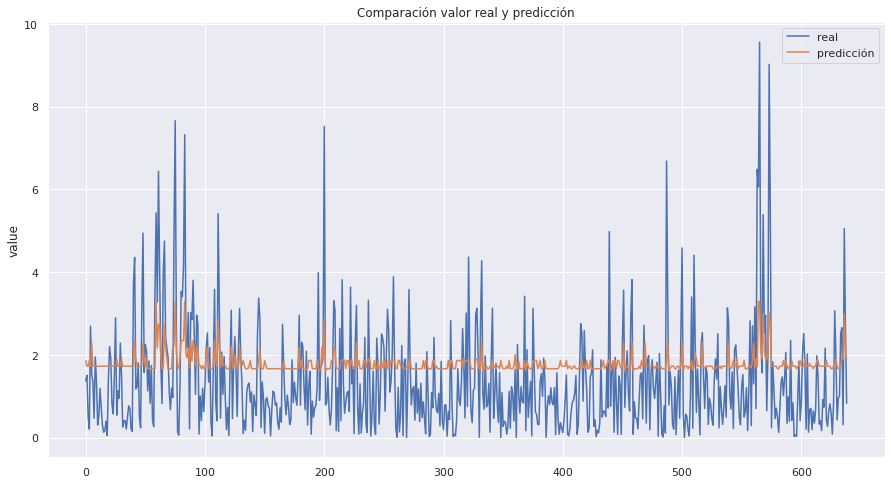

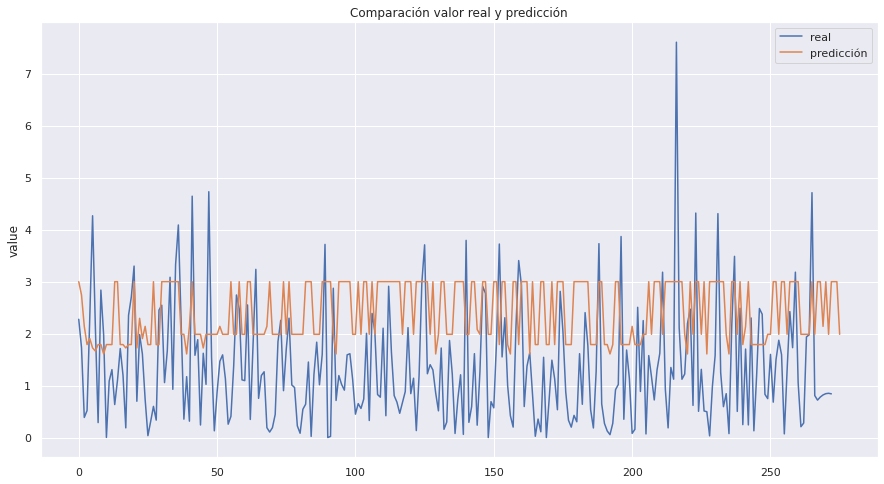

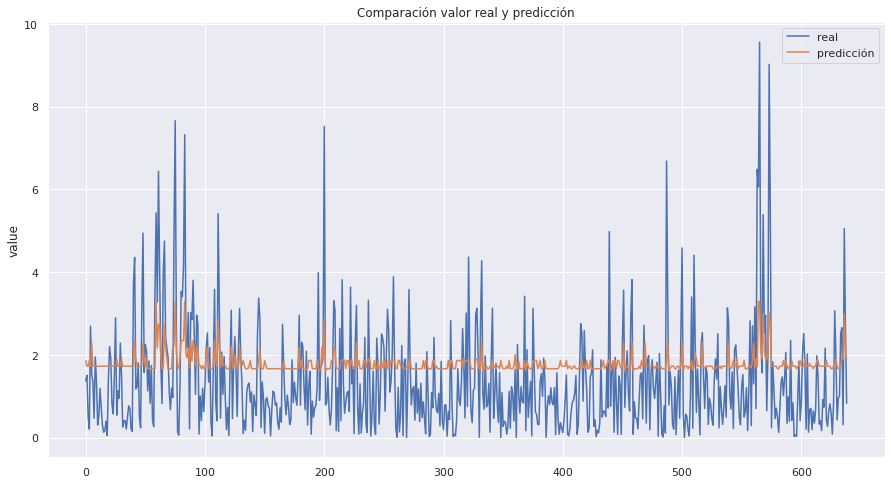

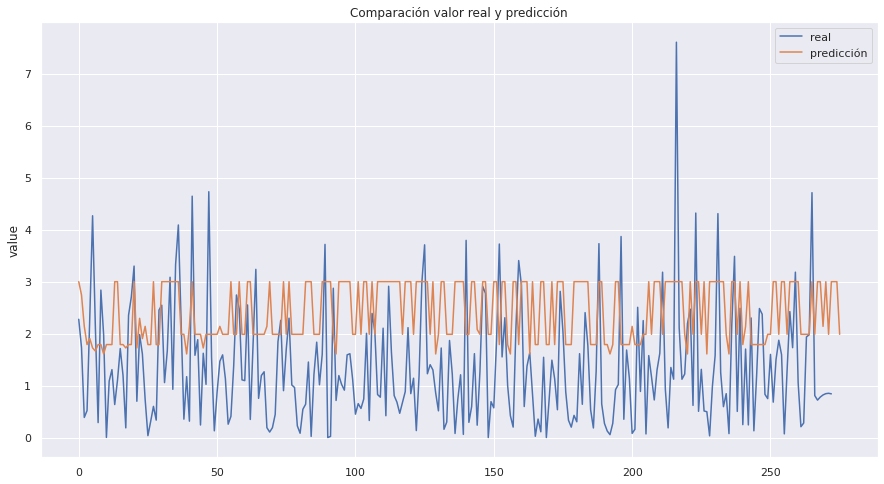

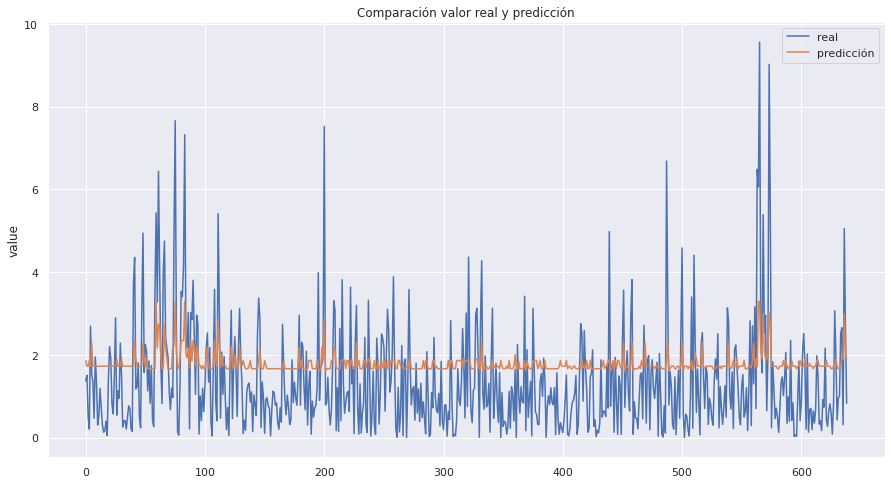

...

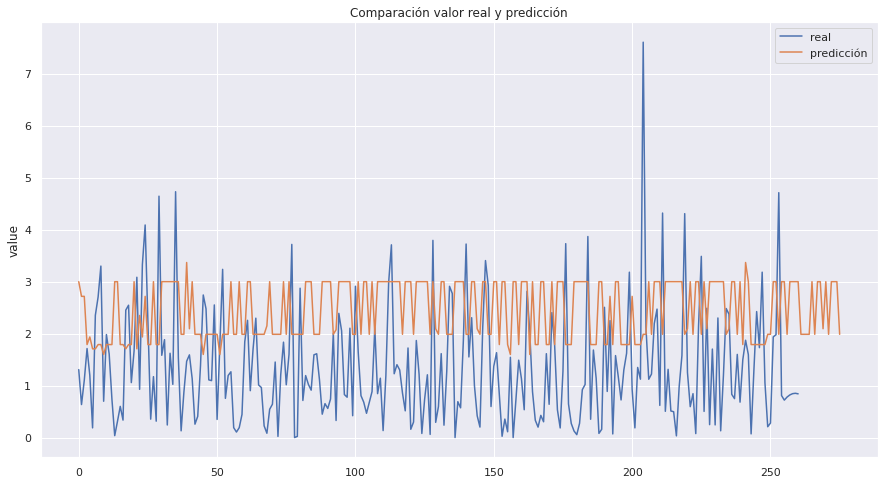

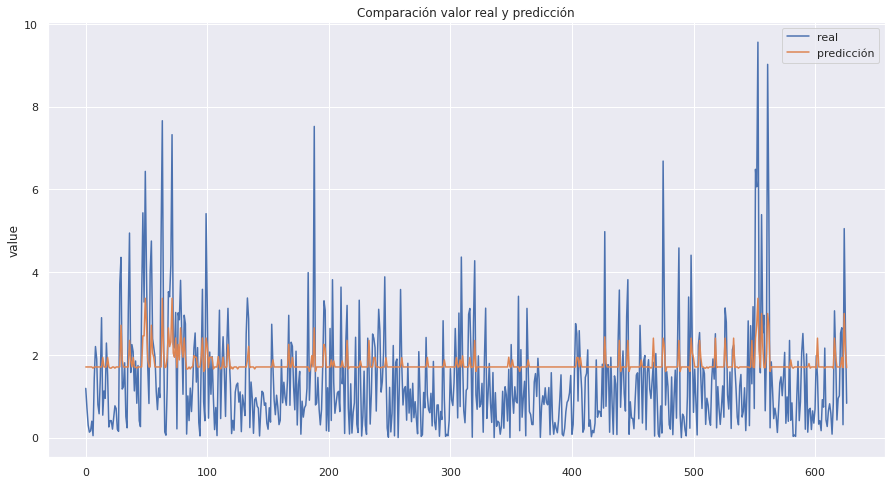

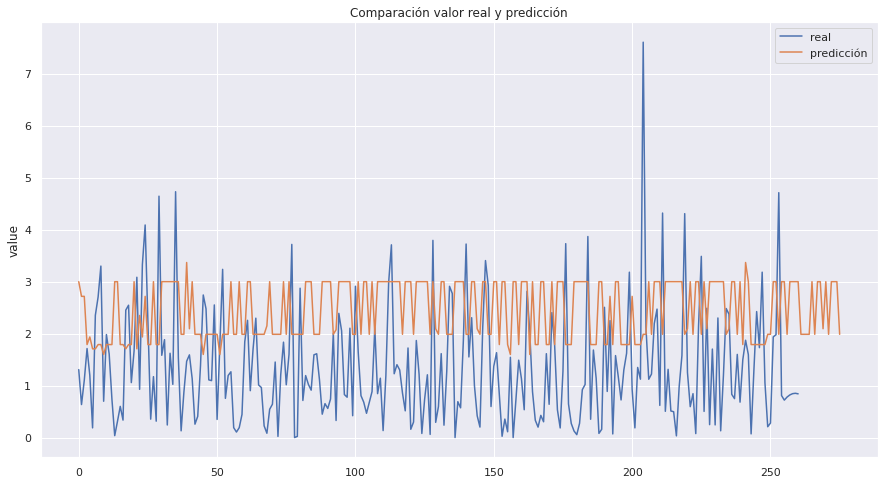

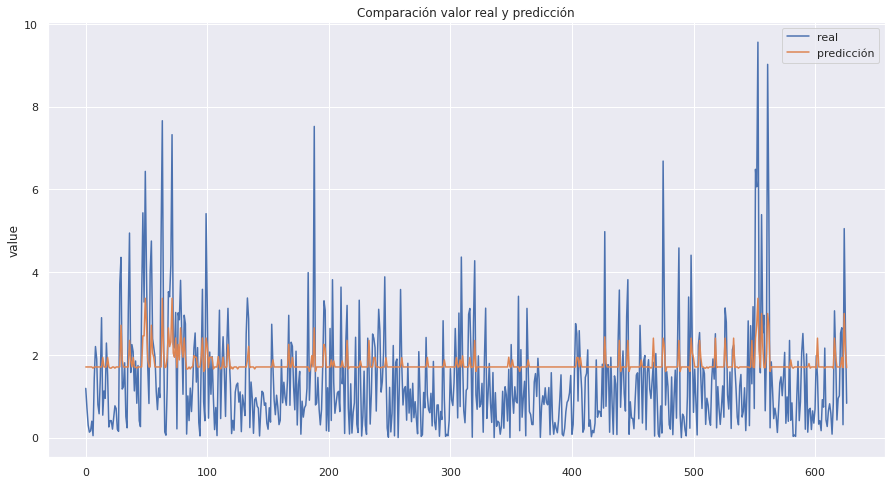

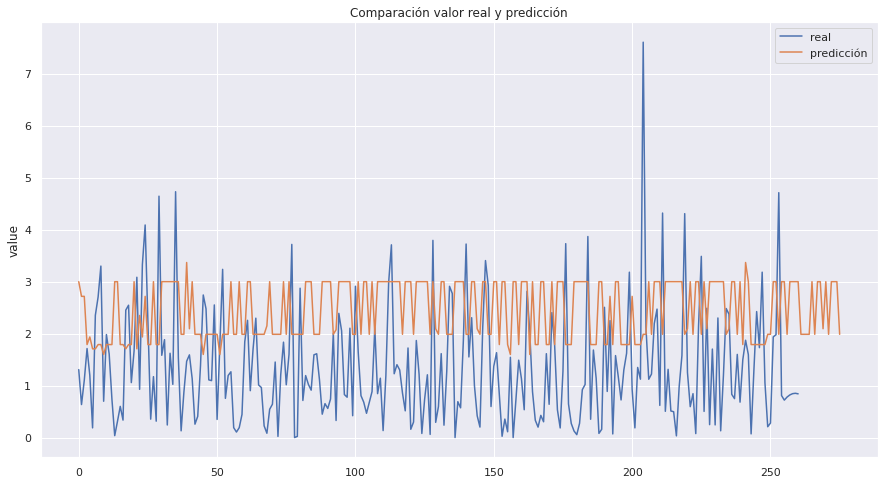

In [11]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)